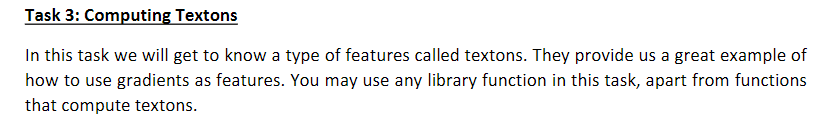

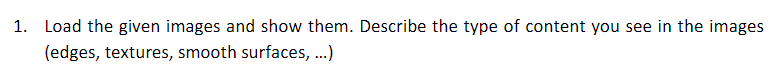

In [5]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import sobel
from sklearn.cluster import KMeans
import os 

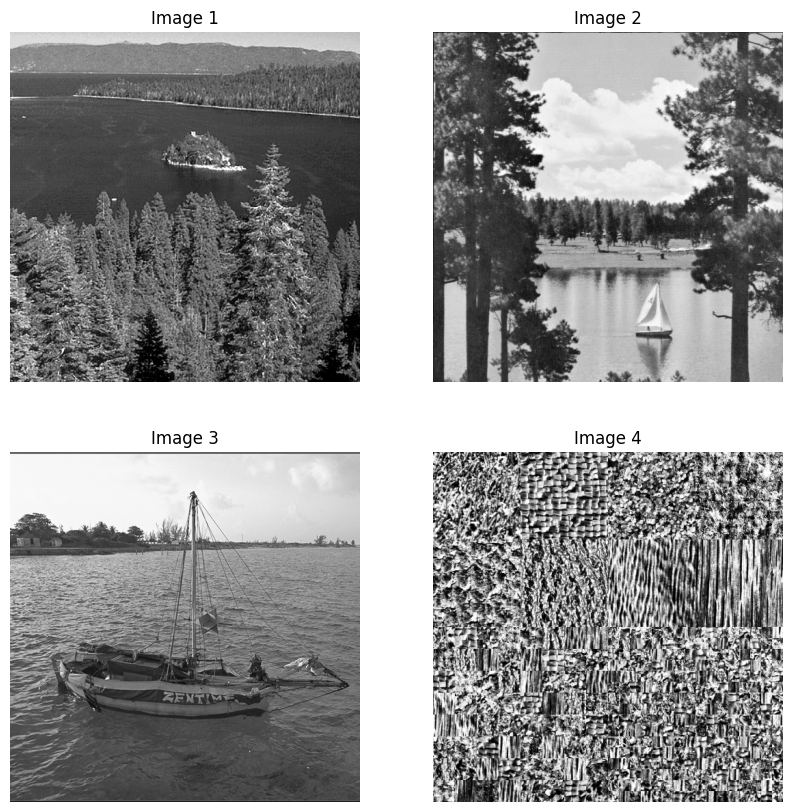

In [17]:
images = []
img_numbers = np.array([15, 45, 81, 171])\

for i in img_numbers:
    image = Image.open(f'Q3/{i}.bmp').convert('L')
    images.append(image)

# Display the images
plt.figure(figsize=(10, 10))
for idx, image in enumerate(images, start=1):
    plt.subplot(2, 2, idx)
    plt.title(f'Image {idx}')
    plt.imshow(image, cmap='gray')
    plt.axis('off')
plt.show()


Image 1:
Edges: Clear edges can be seen where the trees meet the water.
Textures: The foliage of the trees and the water surface exhibit significant texture.
Smooth Surfaces: There are some smooth areas in the water body.

Image 2:
Edges: Distinct edges are present around the trees and the sailing boat.
Textures: The trees have noticeable texture due to the foliage.
Smooth Surfaces: The water surface is relatively smooth with some texture variations.

Image 3:
Edges: Clear edges are visible around the boat and along the horizon.
Textures: The water has a wavy texture.
Smooth Surfaces: The boat and parts of the water surface are relatively smooth.

Image 4:
Edges: High-frequency edges are present throughout the image.
Textures: The image is dominated by high-contrast texture.
Smooth Surfaces: The image appears to be mostly textured.


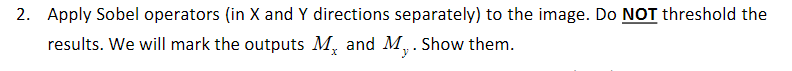

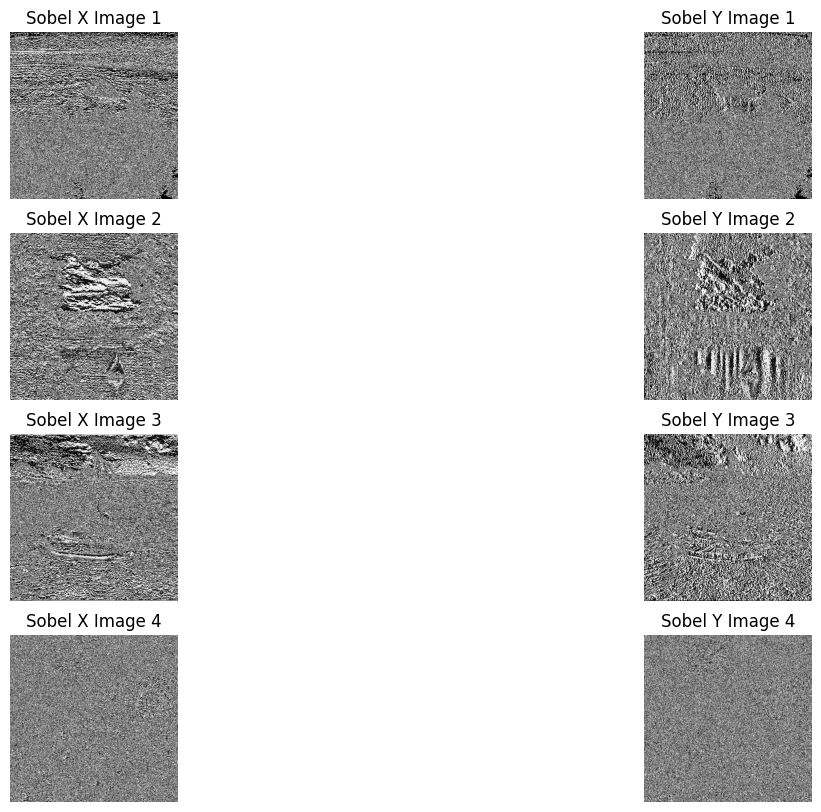

In [18]:
sobel_x_images = [sobel(image, axis=0) for image in images]
sobel_y_images = [sobel(image, axis=1) for image in images]

# Display the results
plt.figure(figsize=(15, 10))
for idx, (sobel_x, sobel_y) in enumerate(zip(sobel_x_images, sobel_y_images), start=1):
    plt.subplot(4, 2, 2 * idx - 1)
    plt.title(f'Sobel X Image {idx}')
    plt.imshow(sobel_x, cmap='gray')
    plt.axis('off')

    plt.subplot(4, 2, 2 * idx)
    plt.title(f'Sobel Y Image {idx}')
    plt.imshow(sobel_y, cmap='gray')
    plt.axis('off')
plt.show()

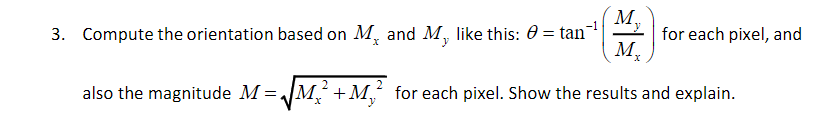

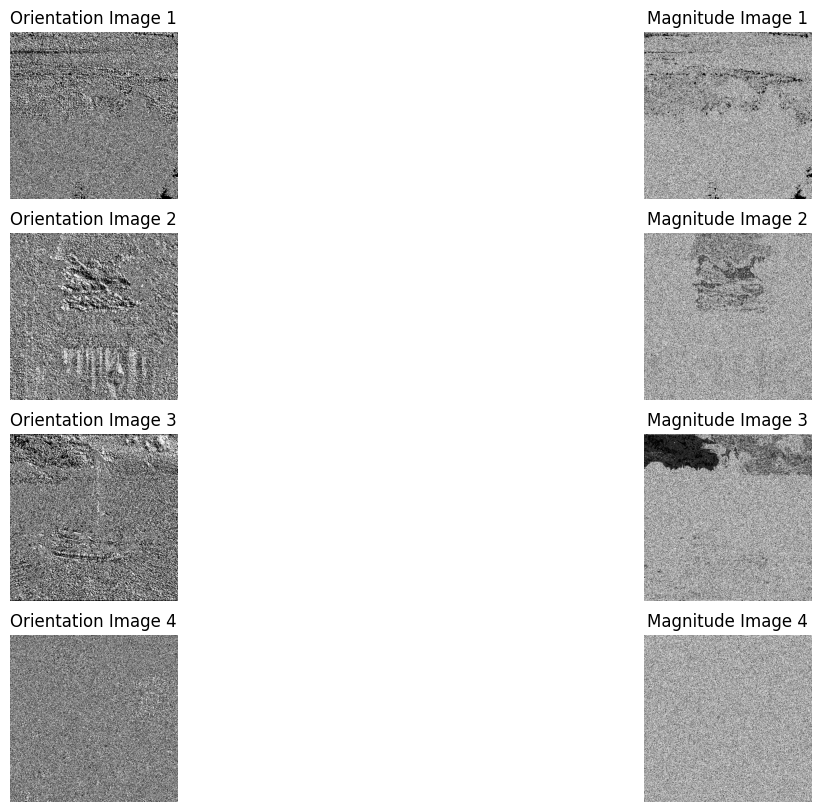

In [19]:
orientations = [np.arctan2(sobel_y, sobel_x) for sobel_x, sobel_y in zip(sobel_x_images, sobel_y_images)]
magnitudes = [np.sqrt(sobel_x ** 2 + sobel_y ** 2) for sobel_x, sobel_y in zip(sobel_x_images, sobel_y_images)]

# Display the results
plt.figure(figsize=(15, 10))
for idx, (orientation, magnitude) in enumerate(zip(orientations, magnitudes), start=1):
    plt.subplot(4, 2, 2 * idx - 1)
    plt.title(f'Orientation Image {idx}')
    plt.imshow(orientation, cmap='gray')
    plt.axis('off')

    plt.subplot(4, 2, 2 * idx)
    plt.title(f'Magnitude Image {idx}')
    plt.imshow(magnitude, cmap='gray')
    plt.axis('off')
plt.show()

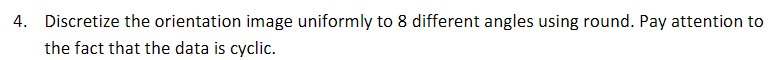

In [20]:
# Q4
# Discretize the orientation into 8 angles
discrete_orientations = [(np.round((orientation + np.pi) * (8 / (2 * np.pi))) % 8).astype(int) for orientation in
                         orientations]


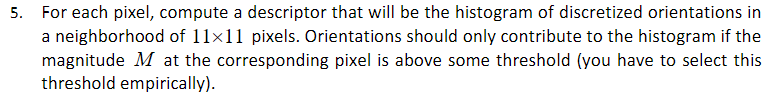

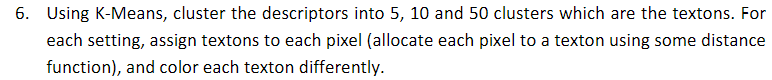

In [23]:
def compute_histogram_descriptor(discretized_orientation, magnitude, threshold, window_size=11):
    half_window = window_size // 2
    descriptors = np.zeros((discretized_orientation.shape[0], discretized_orientation.shape[1], 8))

    for i in range(half_window, discretized_orientation.shape[0] - half_window):
        for j in range(half_window, discretized_orientation.shape[1] - half_window):
            if magnitude[i, j] > threshold:
                window_orientations = discretized_orientation[i - half_window:i + half_window + 1,
                                      j - half_window:j + half_window + 1]
                histogram, _ = np.histogram(window_orientations, bins=8, range=(0, 8))
                descriptors[i, j, :] = histogram

    return descriptors

threshold = np.mean([np.mean(magnitude) for magnitude in magnitudes])
descriptors_list = [compute_histogram_descriptor(discretized_orientation, magnitude, threshold) for
                    discretized_orientation, magnitude in zip(discrete_orientations, magnitudes)]






In [26]:
# Q7
def cluster_descriptors(descriptors, n_clusters):
    descriptors_reshaped = descriptors.reshape(-1, 8)
    kmeans = KMeans(n_clusters=n_clusters).fit(descriptors_reshaped)
    return kmeans.labels_.reshape(descriptors.shape[:2])


textons_list_5 = [cluster_descriptors(descriptors, 5) for descriptors in descriptors_list]
textons_list_10 = [cluster_descriptors(descriptors, 10) for descriptors in descriptors_list]
textons_list_50 = [cluster_descriptors(descriptors, 50) for descriptors in descriptors_list]


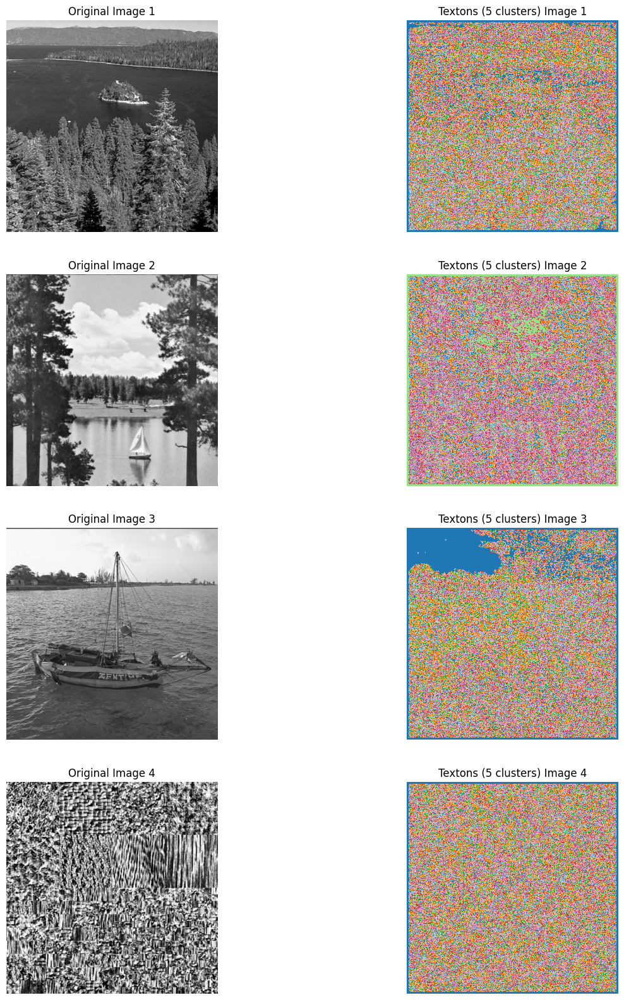

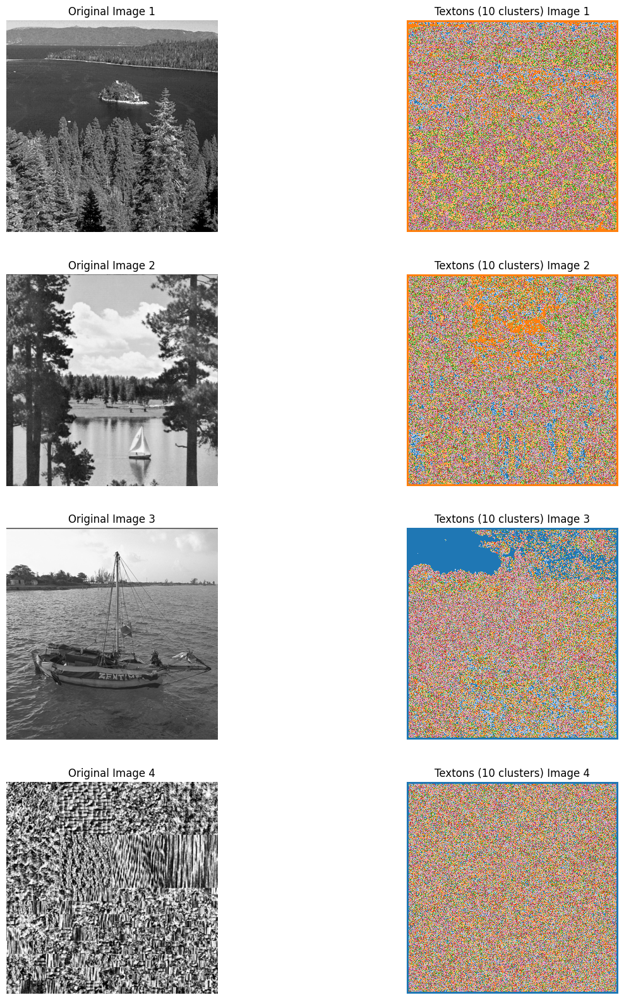

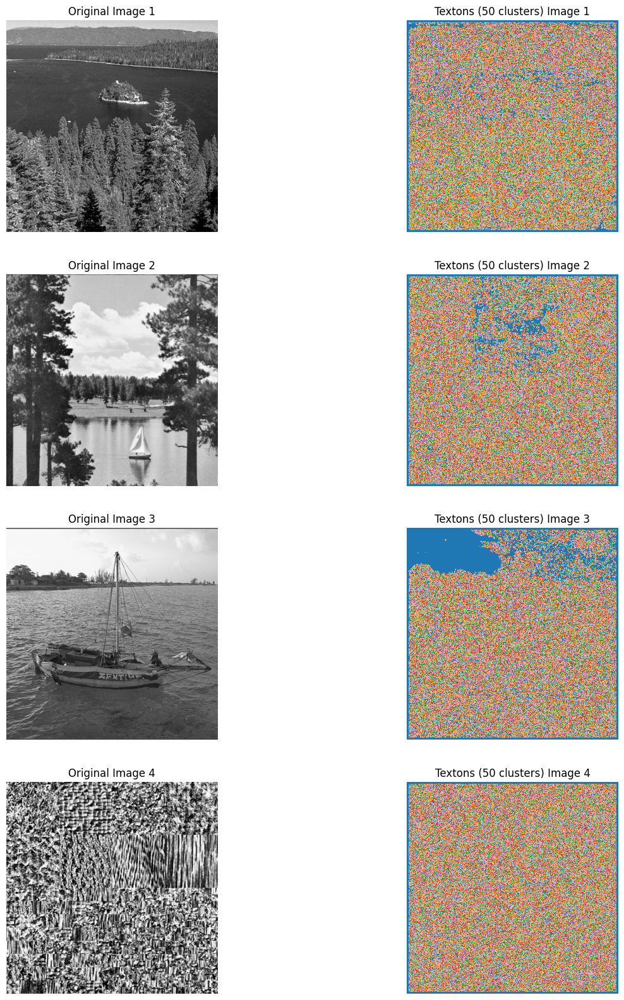

In [25]:
def display_textons_with_original(images, textons_list, title):
    plt.figure(figsize=(15, 20))
    for idx, (original, textons) in enumerate(zip(images, textons_list), start=1):
        plt.subplot(len(images), 2, 2 * idx - 1)
        plt.title(f'Original Image {idx}')
        plt.imshow(original, cmap='gray')
        plt.axis('off')

        plt.subplot(len(images), 2, 2 * idx)
        plt.title(f'{title} Image {idx}')
        plt.imshow(textons, cmap='tab20')
        plt.axis('off')
    plt.show()


display_textons_with_original(images,textons_list_5, 'Textons (5 clusters)')
display_textons_with_original(images,textons_list_10, 'Textons (10 clusters)')
display_textons_with_original(images,textons_list_50, 'Textons (50 clusters)')

Textons are effective in capturing and distinguishing the underlying texture and edge patterns in an image.
We can see for ex. that in image1 there is a clear difference between the upper and lower part - 
that is match the image as the upper part is the water and the lower part is the trees (different texture).

when we increase the clusters we detect more textures, but if we do too much than we cant see anything in the 10 
cluster we see more textures than 5 cluster and can understand more but in 5 we can see other things better (like 
upper and lower in image1). in 50 clusters we cant understand anything and its looks like a mess (beside specific 
places like a super light place-white smooth regen in the image that are just damaged from light)

note: its a mess on image4 because there are no textures in specific places in the image (just high frequency image).

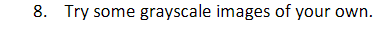

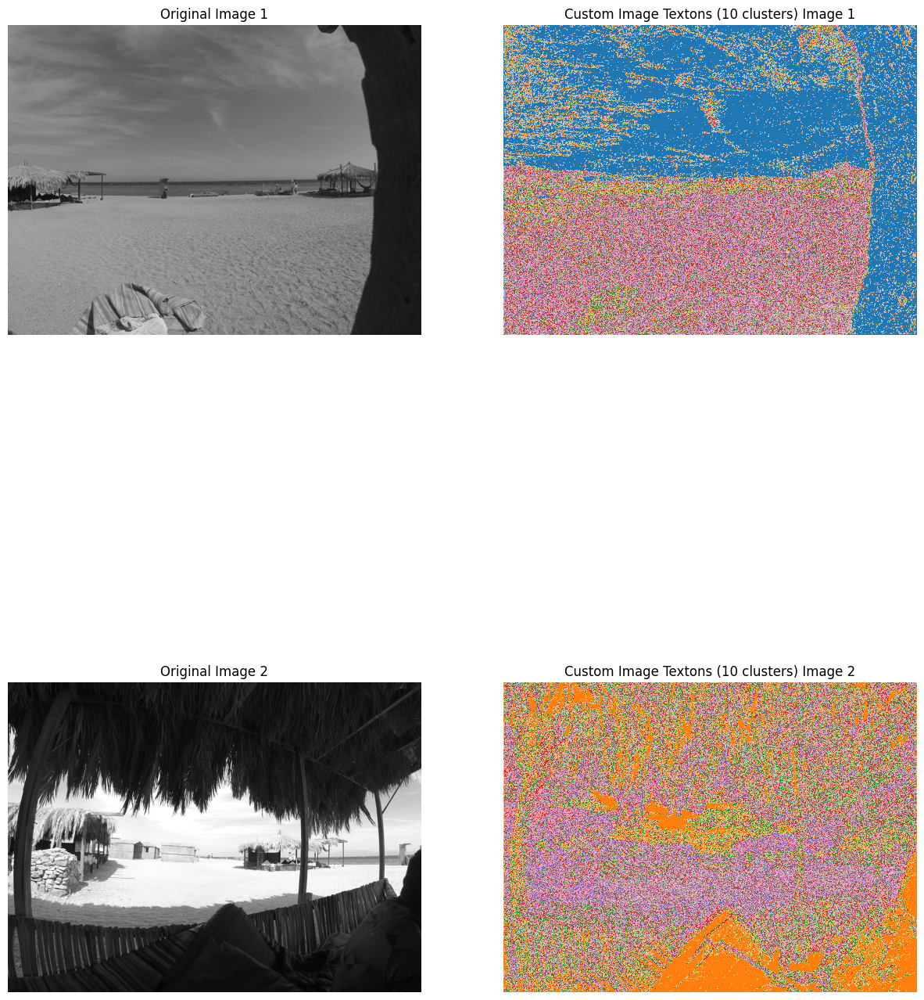

In [27]:
custom_images = []
custom_image_filenames = ['Q3/GOPR5254.JPG', 'Q3/GOPR5258.JPG']

for filename in custom_image_filenames:
    image = Image.open(filename).convert('L')
    custom_images.append(np.array(image))

# Apply Sobel operator in X and Y directions
sobel_x_custom_images = [sobel(image, axis=0) for image in custom_images]
sobel_y_custom_images = [sobel(image, axis=1) for image in custom_images]

# Compute orientation and magnitude
orientations_custom = [np.arctan2(sobel_y, sobel_x) for sobel_x, sobel_y in zip(sobel_x_custom_images, sobel_y_custom_images)]
magnitudes_custom = [np.sqrt(sobel_x ** 2 + sobel_y ** 2) for sobel_x, sobel_y in zip(sobel_x_custom_images, sobel_y_custom_images)]

# Discretize the orientation into 8 angles
discretized_orientations_custom = [(np.round((orientation + np.pi) * (8 / (2 * np.pi))) % 8).astype(int) for orientation in orientations_custom]

threshold = np.mean([np.mean(magnitude) for magnitude in magnitudes_custom])

# Compute histogram descriptors
descriptors_custom_list = [compute_histogram_descriptor(discretized_orientation, magnitude, threshold) for discretized_orientation, magnitude in zip(discretized_orientations_custom, magnitudes_custom)]

# found 10 as best for me
textons_custom_list_10 = [cluster_descriptors(descriptors, 10) for descriptors in descriptors_custom_list]

# Display the results for custom images
display_textons_with_original(custom_images,textons_custom_list_10, 'Custom Image Textons (10 clusters)')
